<a href="https://colab.research.google.com/github/ssuppe/bloogsugarml/blob/main/1)_Blood_Sugar_ML_Investigation_Linear_Regression_Model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Summary

* Part one of the Google Machine Learning Crash Course, but applied to my own blood sugar data (for a practical exercise)

## Goals

* To re-acquaint with linear regression models, and learn the latest python / keras APIs
* Basic analysis of my own blood sugar levels over a single 'good' week (my Clarity app tells me I was 94% in range, 3% high, 2% low)
* My overall goal is to find the predictive power in using basic observable information (in this model, originally just used BG levels in previous periods, and deltas)
* Real goal is to see if I can reasonably predict my BG level 2 hours ahead. Insulin takes ~90 minutes to reach full power, so this is seems like a good goals.

# Findings

* Initial investigation shows just previous readings and deltas are not a very good predictor. RMSE of ~30 to be expected, even if giving a fair amount of history and deltas
* Just visually, the pair plot shows that correlation of previous to 'now' readings drops dramatically at about T-30 minutes. This makes sense to me intuitively.
* I am also aware that being in tight control, picking a random value ~60-120 minutes in the future is likely to be close to the label value (since variance is low), so predictive power needs to be better than choosing at random.

# Next steps

* Going to add in additional observables (insulin on board), but still run linear regression

In [1]:
import json
import pandas as pd

In [43]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Data prep

In [8]:
# First, basic data ingestion and date parsing
with open('/content/drive/MyDrive/src/blood_sugar_ml/nightscout_entries_21-26 July2024.json', "r") as f:
  js = json.load(f)

data = []
# From JSON, create dataset
# display(js[0])
for j in js:
  # display(j['date']['$numberLong'])
  data.append([j['date']['$numberLong'], j['utcOffset'],j['sgv'],j['direction'] ])

data = pd.DataFrame(data)
data.columns = ["timestamp", "utcOffset", "sgv", "direction"]
data['date'] = pd.to_datetime(data['timestamp'],unit='ms')
# Get rid of seconds precision, and round to nearest 5 minutes
data['date'] = data['date'].dt.floor('min').dt.round("5min")
data.head()

<ipython-input-8-63d1207e09da>:14: FutureWarning: The behavior of 'to_datetime' with 'unit' when parsing strings is deprecated. In a future version, strings will be parsed as datetime strings, matching the behavior without a 'unit'. To retain the old behavior, explicitly cast ints or floats to numeric type before calling to_datetime.
  data['date'] = pd.to_datetime(data['timestamp'],unit='ms')


,timestamp,utcOffset,sgv,direction,date
0,1721556338000,60,101,FortyFiveUp,2024-07-21 10:05:00
1,1721556637000,60,110,FortyFiveUp,2024-07-21 10:10:00
2,1721556938000,60,118,FortyFiveUp,2024-07-21 10:15:00
3,1721557237000,60,125,FortyFiveUp,2024-07-21 10:20:00
4,1721557537000,60,127,FortyFiveUp,2024-07-21 10:25:00


In [39]:
# Useful for inspection, but slow
#data.to_csv('/content/drive/MyDrive/src/blood_sugar_ml/nightscout_entries_21-26 July2024.csv')

In [9]:
# Next: creation of features
# Previous absolute values
data["hour"] = data["date"].apply(lambda x: x.hour)

# This code triggers a noise performance warning. I should probably fix it but it's not
# a problem yet so suppressing
from warnings import simplefilter
simplefilter(action="ignore", category=pd.errors.PerformanceWarning)
sgv_features = []
delta = 10
for min in range(60,181,delta):
  data[f"sgv-{min}"] = data["sgv"].shift(int(min/5))
  # According to MLCC, the scale of the parameters should all be roughly the same.
  # Since the delta is a %, I will multiple by 1000 (so, for example, .05 becomes 50)
  data[f"sgv-{min}delta"] = ((data["sgv"].shift(int(min/5)) - data["sgv"].shift(int(min/5)+delta))/data["sgv"].shift(int(min/5)))*1000
  sgv_features.append(f"sgv-{min}")
  sgv_features.append(f"sgv-{min}delta")

data = data.dropna()
data = data.copy()
display(data.head(10))



,timestamp,utcOffset,sgv,direction,date,hour,sgv-60,sgv-60delta,sgv-70,sgv-70delta,...,sgv-140,sgv-140delta,sgv-150,sgv-150delta,sgv-160,sgv-160delta,sgv-170,sgv-170delta,sgv-180,sgv-180delta
46,1721570138000,60,88,Flat,2024-07-21 13:55:00,13,101.0,-356.435644,80.0,-875.000000,...,175.0,22.857143,171.0,198.830409,173.0,265.895954,183.0,355.191257,184.0,451.086957
47,1721570438000,60,89,Flat,2024-07-21 14:00:00,14,104.0,-250.000000,91.0,-582.417582,...,171.0,-52.631579,174.0,114.942529,171.0,239.766082,179.0,301.675978,185.0,405.405405
48,1721570739000,60,90,Flat,2024-07-21 14:05:00,14,98.0,-224.489796,101.0,-356.435644,...,164.0,-121.951220,175.0,22.857143,171.0,198.830409,173.0,265.895954,183.0,355.191257
49,1721571038000,60,90,Flat,2024-07-21 14:10:00,14,89.0,-202.247191,104.0,-250.000000,...,156.0,-185.897436,171.0,-52.631579,174.0,114.942529,171.0,239.766082,179.0,301.675978
50,1721571338000,60,90,Flat,2024-07-21 14:15:00,14,81.0,-160.493827,98.0,-224.489796,...,150.0,-220.000000,164.0,-121.951220,175.0,22.857143,171.0,198.830409,173.0,265.895954
51,1721571638000,60,89,Flat,2024-07-21 14:20:00,14,79.0,-50.632911,89.0,-202.247191,...,144.0,-243.055556,156.0,-185.897436,171.0,-52.631579,174.0,114.942529,171.0,239.766082
52,1721571938000,60,87,Flat,2024-07-21 14:25:00,14,82.0,60.975610,81.0,-160.493827,...,137.0,-262.773723,150.0,-220.000000,164.0,-121.951220,175.0,22.857143,171.0,198.830409
53,1721572238000,60,86,Flat,2024-07-21 14:30:00,14,84.0,95.238095,79.0,-50.632911,...,130.0,-315.384615,144.0,-243.055556,156.0,-185.897436,171.0,-52.631579,174.0,114.942529
54,1721572538000,60,85,Flat,2024-07-21 14:35:00,14,86.0,69.767442,82.0,60.975610,...,120.0,-425.000000,137.0,-262.773723,150.0,-220.000000,164.0,-121.951220,175.0,22.857143
55,1721572839000,60,86,Flat,2024-07-21 14:40:00,14,87.0,-45.977011,84.0,95.238095,...,107.0,-626.168224,130.0,-315.384615,144.0,-243.055556,156.0,-185.897436,171.0,-52.631579


# MLCC Linear regression exercise
Taken from [here](https://colab.corp.google.com/google_src/files/head/depot/google3/engedu/ml/mlcc/next-gen-colabs/linear-regression-exercise.ipynb?mlpp=0)

In [10]:
import io

# data
import numpy as np
import pandas as pd

# machine learning
import keras

# data visualization
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import seaborn as sns

In [11]:
# Describe the data and get to know it
data.describe(include='all')

,timestamp,utcOffset,sgv,direction,date,hour,sgv-60,sgv-60delta,sgv-70,sgv-70delta,...,sgv-140,sgv-140delta,sgv-150,sgv-150delta,sgv-160,sgv-160delta,sgv-170,sgv-170delta,sgv-180,sgv-180delta
count,1370,1370.0,1370.000000,1370,1370,1370.000000,1370.000000,1370.000000,1370.000000,1370.000000,...,1370.000000,1370.000000,1370.000000,1370.000000,1370.000000,1370.000000,1370.000000,1370.000000,1370.000000,1370.000000
unique,1370,NaN,NaN,8,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,1721570138000,NaN,NaN,Flat,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,1,NaN,NaN,1158,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,60.0,111.729197,NaN,2024-07-24 00:00:28.686131712,11.339416,111.602190,-38.002975,111.605839,-38.889523,...,111.987591,-40.631069,112.064964,-40.340904,112.135036,-39.918720,112.226277,-39.488326,112.312409,-39.101545
min,NaN,60.0,40.000000,NaN,2024-07-21 13:55:00,0.000000,40.000000,-2226.415094,40.000000,-2226.415094,...,40.000000,-2226.415094,40.000000,-2226.415094,40.000000,-2226.415094,40.000000,-2226.415094,40.000000,-2226.415094
25%,NaN,60.0,93.000000,NaN,2024-07-22 18:26:15,5.000000,93.000000,-163.265306,93.000000,-164.765614,...,93.000000,-164.234048,93.000000,-164.234048,93.000000,-164.234048,93.000000,-164.234048,93.000000,-164.234048
50%,NaN,60.0,110.000000,NaN,2024-07-24 00:57:30,11.000000,110.000000,0.000000,110.000000,0.000000,...,110.000000,0.000000,110.000000,0.000000,110.000000,0.000000,110.000000,0.000000,110.000000,0.000000
75%,NaN,60.0,129.000000,NaN,2024-07-25 05:28:45,17.000000,129.000000,141.304348,129.000000,141.304348,...,129.000000,141.304348,129.750000,141.386693,130.000000,141.741514,130.000000,142.603850,130.000000,142.603850
max,NaN,60.0,216.000000,NaN,2024-07-26 10:00:00,23.000000,216.000000,694.656489,216.000000,694.656489,...,216.000000,694.656489,216.000000,694.656489,216.000000,694.656489,216.000000,694.656489,216.000000,694.656489


Here are some observations
* This was a good 7 days for me (I knew this already, my Clarity app tells me I was 94% in range, 3% high, 2% low)
* The stats say my mean/median SGV is 112/110, which is awesome
* The mean/median SGV at -120 is also 114, which means that it's basically the same (I'm very stable). So I'm not sure there will be much predictive power. Need to think about how I compare predictive power to random selection.
* Min SGV was 40 (pretty low!) and my max was 216 (pretty high!)

In [12]:
# Correlation matrix
# First, create a df matrix of the features I want to use
numeric_values = ["sgv", "hour"] + sgv_features
df = data[numeric_values]
df.corr(numeric_only = True)

,sgv,hour,sgv-60,sgv-60delta,sgv-70,sgv-70delta,sgv-80,sgv-80delta,sgv-90,sgv-90delta,...,sgv-140,sgv-140delta,sgv-150,sgv-150delta,sgv-160,sgv-160delta,sgv-170,sgv-170delta,sgv-180,sgv-180delta
sgv,1.000000,-0.057695,0.284353,0.259490,0.204674,0.203775,0.143844,0.147134,0.089975,0.083796,...,0.005025,-0.078342,0.019511,-0.066053,0.036189,-0.039302,0.047213,-0.008260,0.047916,0.011745
hour,-0.057695,1.000000,-0.050914,-0.035919,-0.048612,-0.036412,-0.046754,-0.038271,-0.046728,-0.038653,...,-0.062972,-0.014923,-0.068332,-0.009475,-0.074175,-0.008761,-0.086481,-0.017559,-0.102984,-0.031873
sgv-60,0.284353,-0.050914,1.000000,0.533441,0.942482,0.567228,0.819140,0.524045,0.676406,0.458602,...,0.134910,0.152685,0.077519,0.085923,0.028892,0.018855,-0.004736,-0.036800,-0.020166,-0.071739
sgv-60delta,0.259490,-0.035919,0.533441,1.000000,0.374884,0.864901,0.141741,0.584225,-0.108290,0.290471,...,-0.430682,-0.239165,-0.354389,-0.244028,-0.287366,-0.244423,-0.227207,-0.235656,-0.171864,-0.217844
sgv-70,0.204674,-0.048612,0.942482,0.374884,1.000000,0.534362,0.942392,0.566181,0.818926,0.523596,...,0.195756,0.211162,0.131641,0.151647,0.074718,0.084461,0.025428,0.017432,-0.007777,-0.037954
sgv-70delta,0.203775,-0.036412,0.567228,0.864901,0.534362,1.000000,0.377306,0.865683,0.143587,0.588052,...,-0.510073,-0.241074,-0.434908,-0.240472,-0.359216,-0.246249,-0.293548,-0.247329,-0.234073,-0.239481
sgv-80,0.143844,-0.046754,0.819140,0.141741,0.942392,0.377306,1.000000,0.534989,0.942209,0.566717,...,0.273909,0.267835,0.191164,0.209787,0.127676,0.149649,0.069853,0.082442,0.021049,0.015653
sgv-80delta,0.147134,-0.038271,0.524045,0.584225,0.566181,0.865683,0.534989,1.000000,0.377268,0.867431,...,-0.559784,-0.233107,-0.515116,-0.242346,-0.440669,-0.243287,-0.367367,-0.249939,-0.302771,-0.252132
sgv-90,0.089975,-0.046728,0.676406,-0.108290,0.818926,0.143587,0.942209,0.377268,1.000000,0.534192,...,0.380567,0.327106,0.270581,0.267047,0.188504,0.208509,0.124289,0.148418,0.066959,0.081545
sgv-90delta,0.083796,-0.038653,0.458602,0.290471,0.523596,0.588052,0.566717,0.867431,0.534192,1.000000,...,-0.523869,-0.159374,-0.564004,-0.234463,-0.519465,-0.245018,-0.446937,-0.246657,-0.374546,-0.254061


Here are some observation
* The label is "sgv" - I'm trying to figure out what correlates more to my blood sugar now
* I think this isn't enough, I think having hour of day might be interesting. So going to go back and add that as a numerical feature.
* Hour didn't correlate at all, which I found a bit interesting (I figured mealtimes might correlate), but I think this is because hour on its own isn't enough (probably hour and time since last meal, etc)
* Some correlation 60-80 minutes previous, does the reverse hold true (ie, can I predict my BG ~60-80 minutes later?

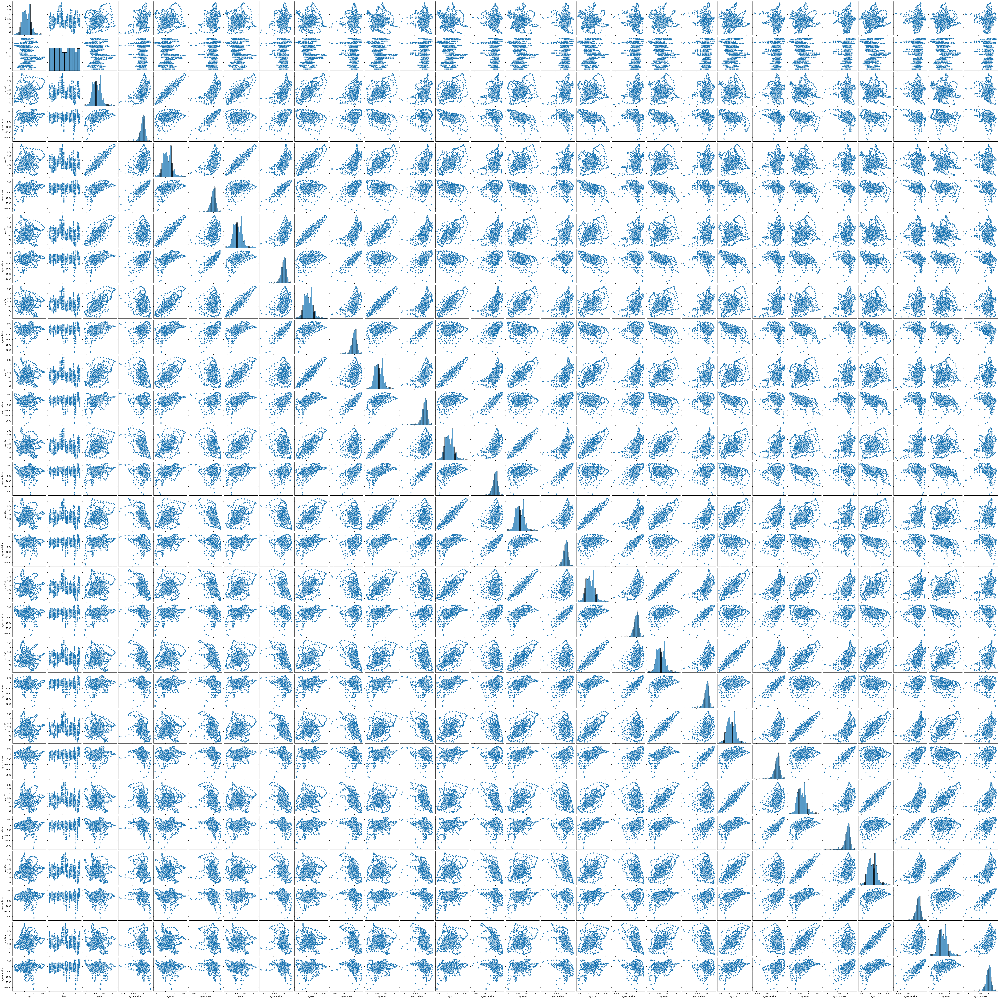

In [38]:
# Pairplot
sns.pairplot(df, x_vars=numeric_values, y_vars=numeric_values)

Observations of the pairplot:
* Almost totally linear correlation for SGV and the SGV 5 minutes ago (which is intuitive)
* Seems like there is some correlation at SGV-15 and at a stretch it looks like SVG-30 and SVG-60 (but still wide variance). Will be interesting to see what the L1 and L2 loss shows
* "Hour" seems to have interesting variation, which I think looks a lot like an hourly distribution plot

Hypothesis: A linear regression model with hour, SGV-5, 30, 60 would be interesting to try. But naively I don't think it'll be good enough to use in practice.

# Part 3 - Train Model


In [13]:
#@title Define plotting functions

def make_plots(df, feature_names, label_name, model_output, sample_size=200):

  random_sample = df.sample(n=sample_size).copy()
  random_sample.reset_index()
  weights, bias, epochs, rmse = model_output

  is_2d_plot = len(feature_names) == 1
  model_plot_type = "scatter" if is_2d_plot else "surface"
  fig = make_subplots(rows=1, cols=2,
                      subplot_titles=("Loss Curve", "Model Plot"),
                      specs=[[{"type": "scatter"}, {"type": model_plot_type}]])

  plot_data(random_sample, feature_names, label_name, fig)
  plot_model(random_sample, feature_names, weights, bias, fig)
  plot_loss_curve(epochs, rmse, fig)

  fig.show()
  return

def plot_loss_curve(epochs, rmse, fig):
  curve = px.line(x=epochs, y=rmse)
  curve.update_traces(line_color='#ff0000', line_width=3)

  fig.append_trace(curve.data[0], row=1, col=1)
  fig.update_xaxes(title_text="Epoch", row=1, col=1)
  fig.update_yaxes(title_text="Root Mean Squared Error", row=1, col=1, range=[rmse.min()*0.8, rmse.max()])

  return

def plot_data(df, features, label, fig):
  if len(features) == 1:
    scatter = px.scatter(df, x=features[0], y=label)
  else:
    scatter = px.scatter_3d(df, x=features[0], y=features[1], z=label)

  fig.append_trace(scatter.data[0], row=1, col=2)
  if len(features) == 1:
    fig.update_xaxes(title_text=features[0], row=1, col=2)
    fig.update_yaxes(title_text=label, row=1, col=2)
  else:
    fig.update_layout(scene1=dict(xaxis_title=features[0], yaxis_title=features[1], zaxis_title=label))

  return

def plot_model(df, features, weights, bias, fig):
  df['FARE_PREDICTED'] = bias[0]

  for index, feature in enumerate(features):
    df['FARE_PREDICTED'] = df['FARE_PREDICTED'] + weights[index][0] * df[feature]

  if len(features) == 1:
    model = px.line(df, x=features[0], y='FARE_PREDICTED')
    model.update_traces(line_color='#ff0000', line_width=3)
  else:
    z_name, y_name = "FARE_PREDICTED", features[1]
    z = [df[z_name].min(), (df[z_name].max() - df[z_name].min()) / 2, df[z_name].max()]
    y = [df[y_name].min(), (df[y_name].max() - df[y_name].min()) / 2, df[y_name].max()]
    x = []
    for i in range(len(y)):
      x.append((z[i] - weights[1][0] * y[i] - bias[0]) / weights[0][0])

    plane=pd.DataFrame({'x':x, 'y':y, 'z':[z] * 3})

    light_yellow = [[0, '#89CFF0'], [1, '#FFDB58']]
    model = go.Figure(data=go.Surface(x=plane['x'], y=plane['y'], z=plane['z'],
                                      colorscale=light_yellow))

  fig.add_trace(model.data[0], row=1, col=2)

  return

def model_info(feature_names, label_name, model_output):
  weights = model_output[0]
  bias = model_output[1]

  nl = "\n"
  header = "-" * 80
  banner = header + nl + "|" + "MODEL INFO".center(78) + "|" + nl + header

  info = ""
  equation = label_name + " = "

  for index, feature in enumerate(feature_names):
    info = info + "Weight for feature[{}]: {:.3f}\n".format(feature, weights[index][0])
    equation = equation + "{:.3f} * {} + ".format(weights[index][0], feature)

  info = info + "Bias: {:.3f}\n".format(bias[0])
  equation = equation + "{:.3f}\n".format(bias[0])

  return banner + nl + info + nl + equation

print("SUCCESS: defining plotting functions complete.")

SUCCESS: defining plotting functions complete.


In [14]:
#@title Code - Define ML functions

def build_model(my_learning_rate, num_features):
  """Create and compile a simple linear regression model."""
  # Most simple keras models are sequential.
  model = keras.models.Sequential()

  # Describe the topography of the model.
  # The topography of a simple linear regression model
  # is a single node in a single layer.
  model.add(keras.layers.Dense(units=1,
                                  input_shape=(num_features,)))

  # Compile the model topography into code that TensorFlow can efficiently
  # execute. Configure training to minimize the model's mean squared error.
  model.compile(optimizer=keras.optimizers.RMSprop(learning_rate=my_learning_rate),
                loss="mean_squared_error",
                metrics=[keras.metrics.RootMeanSquaredError()])

  return model


def train_model(model, df, features, label, epochs, batch_size):
  """Train the model by feeding it data."""

  # Feed the model the feature and the label.
  # The model will train for the specified number of epochs.
  # input_x = df.iloc[:,1:3].values
  # df[feature]
  history = model.fit(x=features,
                      y=label,
                      batch_size=batch_size,
                      epochs=epochs)

  # Gather the trained model's weight and bias.
  trained_weight = model.get_weights()[0]
  trained_bias = model.get_weights()[1]

  # The list of epochs is stored separately from the rest of history.
  epochs = history.epoch

  # Isolate the error for each epoch.
  hist = pd.DataFrame(history.history)

  # To track the progression of training, we're going to take a snapshot
  # of the model's root mean squared error at each epoch.
  rmse = hist["root_mean_squared_error"]

  return trained_weight, trained_bias, epochs, rmse


def run_experiment(df, feature_names, label_name, learning_rate, epochs, batch_size):

  print('INFO: starting training experiment with features={} and label={}\n'.format(feature_names, label_name))

  num_features = len(feature_names)

  features = df.loc[:, feature_names].values
  label = df[label_name].values
  # display(features)
  # display(label)
  model = build_model(learning_rate, num_features)
  model_output = train_model(model, df, features, label, epochs, batch_size)

  print('\nSUCCESS: training experiment complete\n')
  print('{}'.format(model_info(feature_names, label_name, model_output)))
  make_plots(df, feature_names, label_name, model_output)

  return model

print("SUCCESS: defining linear regression functions complete.")

SUCCESS: defining linear regression functions complete.


In [22]:
#@title Code - Experiment 1 with SVG-60

# The following variables are the hyperparameters.
learning_rate = 0.05
epochs = 100
batch_size = 50

# Specify the feature and the label.
features = ['sgv-60']
label = 'sgv'

model_1 = run_experiment(df.dropna(), features, label, learning_rate, epochs, batch_size)

INFO: starting training experiment with features=['sgv-60'] and label=sgv

Epoch 1/100
28/28 [==============================] - 1s 2ms/step - loss: 1080.9193 - root_mean_squared_error: 32.8773
Epoch 2/100
28/28 [==============================] - 0s 2ms/step - loss: 1001.2617 - root_mean_squared_error: 31.6427
Epoch 3/100
28/28 [==============================] - 0s 1ms/step - loss: 986.5955 - root_mean_squared_error: 31.4101
Epoch 4/100
28/28 [==============================] - 0s 1ms/step - loss: 979.7006 - root_mean_squared_error: 31.3002
Epoch 5/100
28/28 [==============================] - 0s 1ms/step - loss: 971.3882 - root_mean_squared_error: 31.1671
Epoch 6/100
28/28 [==============================] - 0s 1ms/step - loss: 966.2869 - root_mean_squared_error: 31.0852
Epoch 7/100
28/28 [==============================] - 0s 1ms/step - loss: 961.7295 - root_mean_squared_error: 31.0118
Epoch 8/100
28/28 [==============================] - 0s 1ms/step - loss: 962.8527 - root_mean_squared_er

In [23]:
#@title Code - Experiment 1 with SVG-120

# The following variables are the hyperparameters.
learning_rate = 0.05
epochs = 100
batch_size = 50

# Specify the feature and the label.
features = ['sgv-80']
label = 'sgv'

model_1 = run_experiment(df.dropna(), features, label, learning_rate, epochs, batch_size)

INFO: starting training experiment with features=['sgv-80'] and label=sgv

Epoch 1/100
28/28 [==============================] - 0s 1ms/step - loss: 1622.9510 - root_mean_squared_error: 40.2859
Epoch 2/100
28/28 [==============================] - 0s 2ms/step - loss: 1173.0919 - root_mean_squared_error: 34.2504
Epoch 3/100
28/28 [==============================] - 0s 2ms/step - loss: 1175.8995 - root_mean_squared_error: 34.2914
Epoch 4/100
28/28 [==============================] - 0s 2ms/step - loss: 1159.3196 - root_mean_squared_error: 34.0488
Epoch 5/100
28/28 [==============================] - 0s 1ms/step - loss: 1164.8087 - root_mean_squared_error: 34.1293
Epoch 6/100
28/28 [==============================] - 0s 2ms/step - loss: 1139.2256 - root_mean_squared_error: 33.7524
Epoch 7/100
28/28 [==============================] - 0s 2ms/step - loss: 1128.0048 - root_mean_squared_error: 33.5858
Epoch 8/100
28/28 [==============================] - 0s 2ms/step - loss: 1140.3918 - root_mean_squa

Observations are pretty intuitive.
60 minutes before, within 29 mg/dl (doesn't seem very good). The mean sgv-60 is -38, so I think this is a little better than choosing at random on average (but not very much)
80 minutes before, within about 29 (also not very good)




In [28]:
#@title Code - Experiment 3 - multidimensional (sgv-?, and hour)

# The following variables are the hyperparameters.
learning_rate = 0.1
epochs = 50
batch_size = 50

features_5 = ['sgv-60', 'hour']
label = 'sgv'

model_5 = run_experiment(df.dropna(), features_5, label, learning_rate, epochs, batch_size)

INFO: starting training experiment with features=['sgv-60', 'hour'] and label=sgv

Epoch 1/50
28/28 [==============================] - 1s 4ms/step - loss: 5706.1445 - root_mean_squared_error: 75.5390
Epoch 2/50
28/28 [==============================] - 0s 2ms/step - loss: 960.1705 - root_mean_squared_error: 30.9866
Epoch 3/50
28/28 [==============================] - 0s 3ms/step - loss: 976.5048 - root_mean_squared_error: 31.2491
Epoch 4/50
28/28 [==============================] - 0s 4ms/step - loss: 935.9112 - root_mean_squared_error: 30.5927
Epoch 5/50
28/28 [==============================] - 0s 1ms/step - loss: 961.2623 - root_mean_squared_error: 31.0042
Epoch 6/50
28/28 [==============================] - 0s 2ms/step - loss: 960.2257 - root_mean_squared_error: 30.9875
Epoch 7/50
28/28 [==============================] - 0s 1ms/step - loss: 932.7485 - root_mean_squared_error: 30.5409
Epoch 8/50
28/28 [==============================] - 0s 1ms/step - loss: 937.6696 - root_mean_squared_err

Adding hour seemed to 'help' (28 instead of 30) but not practically better

In [32]:
#@title Code - Experiment 3 - multidimensional (sgv-?, and hour)

# The following variables are the hyperparameters.
learning_rate = 0.05
epochs = 100
batch_size = 50

features_all = ['sgv-60', 'sgv-60delta','hour']
label = 'sgv'

model_all = run_experiment(df.dropna(), features_all, label, learning_rate, epochs, batch_size)

INFO: starting training experiment with features=['sgv-60', 'sgv-60delta', 'hour'] and label=sgv

Epoch 1/100
28/28 [==============================] - 0s 2ms/step - loss: 13562.5654 - root_mean_squared_error: 116.4584
Epoch 2/100
28/28 [==============================] - 0s 2ms/step - loss: 1188.4756 - root_mean_squared_error: 34.4743
Epoch 3/100
28/28 [==============================] - 0s 2ms/step - loss: 1051.2709 - root_mean_squared_error: 32.4233
Epoch 4/100
28/28 [==============================] - 0s 2ms/step - loss: 980.3401 - root_mean_squared_error: 31.3104
Epoch 5/100
28/28 [==============================] - 0s 3ms/step - loss: 1040.6299 - root_mean_squared_error: 32.2588
Epoch 6/100
28/28 [==============================] - 0s 2ms/step - loss: 963.9283 - root_mean_squared_error: 31.0472
Epoch 7/100
28/28 [==============================] - 0s 2ms/step - loss: 961.0064 - root_mean_squared_error: 31.0001
Epoch 8/100
28/28 [==============================] - 0s 2ms/step - loss: 1008

Adding in delta doesn't seem to matter. What if we look further into the past?

In [35]:
#@title Code - Experiment 3 - multidimensional (sgv-?, and hour)

# The following variables are the hyperparameters.
learning_rate = 0.001
epochs = 500
batch_size = 50

features_all = ['sgv-60', 'sgv-60delta','sgv-70', 'sgv-70delta','sgv-80', 'sgv-80delta','sgv-90', 'sgv-90delta','hour']
label = 'sgv'

model_all = run_experiment(df.dropna(), features_all, label, learning_rate, epochs, batch_size)

INFO: starting training experiment with features=['sgv-60', 'sgv-60delta', 'sgv-70', 'sgv-70delta', 'sgv-80', 'sgv-80delta', 'sgv-90', 'sgv-90delta', 'hour'] and label=sgv

Epoch 1/500
28/28 [==============================] - 0s 2ms/step - loss: 44154.3867 - root_mean_squared_error: 210.1295
Epoch 2/500
28/28 [==============================] - 0s 2ms/step - loss: 36435.2422 - root_mean_squared_error: 190.8802
Epoch 3/500
28/28 [==============================] - 0s 2ms/step - loss: 30509.0957 - root_mean_squared_error: 174.6685
Epoch 4/500
28/28 [==============================] - 0s 2ms/step - loss: 25841.7930 - root_mean_squared_error: 160.7538
Epoch 5/500
28/28 [==============================] - 0s 2ms/step - loss: 21985.3887 - root_mean_squared_error: 148.2747
Epoch 6/500
28/28 [==============================] - 0s 2ms/step - loss: 18676.2422 - root_mean_squared_error: 136.6610
Epoch 7/500
28/28 [==============================] - 0s 2ms/step - loss: 15858.2031 - root_mean_squared_err

KeyboardInterrupt: 

Adding in more history of sgvs and deltas doesn't help loss. We still end up with RMSE of ~29.

# Part 4 - Validate Model


---


## Use the model to make predictions

Now that you have a trained model, you can use the model to make predictions. In practice, you should make predictions on examples that are not used during training. However, for this exercise, you'll just work with a subset of the same training dataset. In another Colab exercise you will explore ways to make predictions on examples not used in training.

In [36]:
#@title Code - Define functions to make predictions
def format_currency(x):
  return "${:.2f}".format(x)

def build_batch(df, batch_size):
  batch = df.sample(n=batch_size).copy()
  batch.set_index(np.arange(batch_size), inplace=True)
  return batch

def predict_fare(model, df, features, label, batch_size=50):
  batch = build_batch(df, batch_size)
  predicted_values = model.predict_on_batch(x=batch.loc[:, features].values)

  data = {"PREDICTED_SGV": [], "OBSERVED_SGV": [], "L1_LOSS": [],
          features[0]: [], features[1]: []}
  for i in range(batch_size):
    predicted = predicted_values[i][0]
    observed = batch.at[i, label]
    data["PREDICTED_SGV"].append(predicted)
    data["OBSERVED_SGV"].append(observed)
    data["L1_LOSS"].append(abs(observed - predicted))
    data[features[0]].append(batch.at[i, features[0]])
    data[features[1]].append("{:.2f}".format(batch.at[i, features[1]]))

  output_df = pd.DataFrame(data)
  return output_df

def show_predictions(output):
  header = "-" * 80
  banner = header + "\n" + "|" + "PREDICTIONS".center(78) + "|" + "\n" + header
  print(banner)
  print(output)
  return

In [37]:
#@title Code - Make predictions

output = predict_fare(model_all, df, features_all, label)
show_predictions(output)

--------------------------------------------------------------------------------
|                                 PREDICTIONS                                  |
--------------------------------------------------------------------------------
    PREDICTED_SGV  OBSERVED_SGV     L1_LOSS  sgv-60 sgv-60delta
0      120.220802           134   13.779198   136.0      220.59
1      108.343628           133   24.656372   126.0      222.22
2       86.049698           117   30.950302   105.0      133.33
3       98.921951           128   29.078049    96.0      104.17
4      121.063606            96   25.063606   139.0      115.11
5      120.380783           142   21.619217   135.0     -103.70
6      107.143677           116    8.856323   115.0       60.87
7      122.685997           134   11.314003   140.0      135.71
8      138.200882           129    9.200882   155.0      283.87
9       78.762672            78    0.762672    68.0     -191.18
10     110.561569           134   23.438431   111.0  